In [1]:
!pip install fredapi

The fredapi package is a Python library that provides access to the Federal Reserve Economic Data (FRED) API. 
FRED is a comprehensive database of economic data maintained by the Federal Reserve Bank of St. Louis.
It includes a wide range of economic indicators, such
as interest rates, employment statistics, GDP, and more.
Similarly you can also get data from yahoo finance,investing.com etc by web scraping.

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
color_pal=plt.rcParams["axes.prop_cycle"].by_key()["color"]


In [3]:
from fredapi import Fred

# Initialize the API with your API key
api_key = '2260cc6d0383e514e339ec4d7fea2b8e'
fred = Fred(api_key=api_key)



In [4]:
#Here We are searching for S&P Data from Fred
sp_search=fred.search('S&P',limit=1000,order_by='popularity')
sp_search

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-09-17,2024-09-17,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-09-16,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-09-17 09:18:09-05:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-09-17,2024-09-17,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-06-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2024-08-27 08:12:01-05:00,88,"For more information regarding the index, plea..."
SP500,SP500,2024-09-17,2024-09-17,S&P 500,2014-09-17,2024-09-16,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-09-16 19:16:41-05:00,83,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2024-09-17,2024-09-17,Real Median Household Income in the United States,1984-01-01,2023-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2024-09-11 09:45:01-05:00,83,Household data are collected as of March. As ...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-09-17,2024-09-17,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-09-16,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-09-17 09:18:12-05:00,82,This data represents the effective yield of th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PLKCPPILA670NRUG,PLKCPPILA670NRUG,2024-09-17,2024-09-17,Price Level of the Capital Stock for Israel,1954-01-01,2019-01-01,Annual,A,Price Level of USA Output-side GDP in 2017=1,Price Level of USA Output-side GDP in 2017=1,Not Seasonally Adjusted,NSA,2023-02-27 14:33:14-06:00,3,Source ID: pl_k When using these data in your...
DDDI12GDA156NWDB,DDDI12GDA156NWDB,2024-09-17,2024-09-17,Private Credit by Deposit Money Banks and Othe...,1970-01-01,2020-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2022-03-23 16:31:38-05:00,3,Private credit by deposit money banks and othe...
DDDI01GTA156NWDB,DDDI01GTA156NWDB,2024-09-17,2024-09-17,Private Credit by Deposit Money Banks to GDP f...,1960-01-01,2021-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-07 15:28:51-05:00,3,The financial resources provided to the privat...


In [5]:
#Pulling Data with ID SP500
sp500 = fred.get_series('SP500')
sp500


2014-09-17    2001.57
2014-09-18    2011.36
2014-09-19    2010.40
2014-09-22    1994.29
2014-09-23    1982.77
               ...   
2024-09-10    5495.52
2024-09-11    5554.13
2024-09-12    5595.76
2024-09-13    5626.02
2024-09-16    5633.09
Length: 2609, dtype: float64

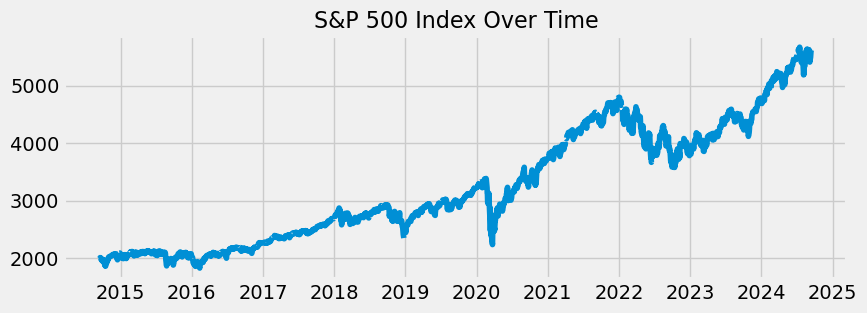

In [6]:
plt.figure(figsize=(9, 3))
plt.plot(sp500.index, sp500.values)

# Add title and labels
plt.title('S&P 500 Index Over Time', fontsize=16)

plt.show()


In [7]:
#Searching for unemployement data in FRED
unemployment_search_results=fred.search('unemployment')
unemployment_search_results

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-09-17,2024-09-17,Unemployment Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:02-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-09-17,2024-09-17,Unemployment Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-09-06 07:46:18-05:00,58,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-09-17,2024-09-17,Unemployment Level,1948-01-01,2024-08-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-09-06 07:47:03-05:00,71,The series comes from the 'Current Population ...
NROU,NROU,2024-09-17,2024-09-17,Noncyclical Rate of Unemployment,1949-01-01,2034-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2024-07-01 12:01:04-05:00,69,"Starting with the July, 2021 report: An Update..."
CCSA,CCSA,2024-09-17,2024-09-17,Continued Claims (Insured Unemployment),1967-01-07,2024-08-31,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-09-12 07:33:04-05:00,74,"Continued claims, also referred to as insured ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAUCN340030000000003A,LAUCN340030000000003A,2024-09-17,2024-09-17,"Unemployment Rate in Bergen County, NJ",1990-01-01,2023-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-01 10:48:38-05:00,0,These data come from the Current Population Su...
LMUNRRTTLUM156S,LMUNRRTTLUM156S,2024-09-17,2024-09-17,Infra-Annual Registered Unemployment and Job V...,1995-01-01,2023-12-01,Monthly,M,Growth rate previous period,Growth rate previous period,Seasonally Adjusted,SA,2024-04-10 11:07:38-05:00,5,OECD Data Filters: REF_AREA: LUX MEASURE: REG...
LNS14000315,LNS14000315,2024-09-17,2024-09-17,Unemployment Rate - Married Women,1955-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:22-05:00,9,To obtain estimates of women worker employment...


In [8]:
#Getting the most popular data of Unemployement from Fred using its ID
unrate = fred.get_series('UNRATE')
unrate


1948-01-01    3.4
1948-02-01    3.8
1948-03-01    4.0
1948-04-01    3.9
1948-05-01    3.5
             ... 
2024-04-01    3.9
2024-05-01    4.0
2024-06-01    4.1
2024-07-01    4.3
2024-08-01    4.2
Length: 920, dtype: float64

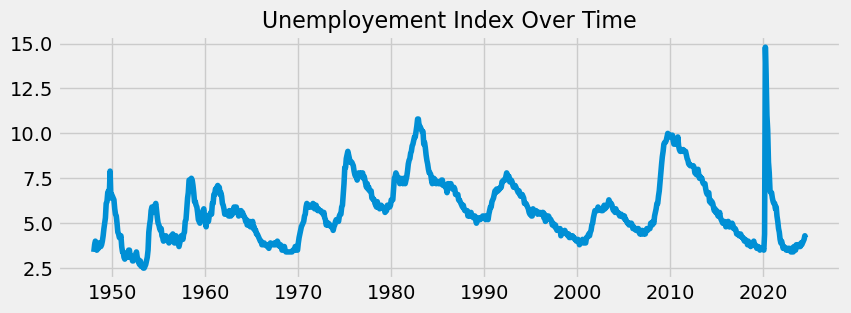

In [9]:
plt.figure(figsize=(9, 3))
plt.plot(unrate.index, unrate.values)

# Add title and labels
plt.title('Unemployement Index Over Time', fontsize=16)

plt.show()


In [10]:
unemployment_search_state = fred.search('unemployment rate state', filter=('frequency', 'Monthly'))
unemployment_search_state


,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-09-17,2024-09-17,Unemployment Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:02-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-09-17,2024-09-17,Unemployment Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-09-06 07:46:18-05:00,58,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-09-17,2024-09-17,Unemployment Rate - Black or African American,1972-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:16-05:00,72,The series comes from the 'Current Population ...
UNEMPLOY,UNEMPLOY,2024-09-17,2024-09-17,Unemployment Level,1948-01-01,2024-08-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-09-06 07:47:03-05:00,71,The series comes from the 'Current Population ...
LNU03000000,LNU03000000,2024-09-17,2024-09-17,Unemployment Level,1948-01-01,2024-08-01,Monthly,M,Thousands of Persons,Thous. of Persons,Not Seasonally Adjusted,NSA,2024-09-06 07:46:37-05:00,27,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INBART5URN,INBART5URN,2024-09-17,2024-09-17,"Unemployment Rate in Bartholomew County, IN",1990-01-01,2024-07-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-08-28 10:26:13-05:00,2,These data come from the Current Population Su...
MOPRURN,MOPRURN,2024-09-17,2024-09-17,"Unemployment Rate in Perry County, MO",1990-01-01,2024-07-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-08-28 10:30:40-05:00,2,These data come from the Current Population Su...
PENS812UR,PENS812UR,2024-09-17,2024-09-17,Unemployment Rate in Pensacola-Ferry Pass-Bren...,1990-01-01,2024-07-01,Monthly,M,Percent,%,Smoothed Seasonally Adjusted,SSA,2024-08-28 13:32:20-05:00,1,None


In [11]:
#we are adding more filters for getting concise and pin point data
unemployment_search_state=unemployment_search_state.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemployment_search_state

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-09-17,2024-09-17,Unemployment Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:02-05:00,95,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-09-17,2024-09-17,Unemployment Rate - Black or African American,1972-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:16-05:00,72,The series comes from the 'Current Population ...
U6RATE,U6RATE,2024-09-17,2024-09-17,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:46:17-05:00,67,The series comes from the 'Current Population ...
CAUR,CAUR,2024-09-17,2024-09-17,Unemployment Rate in California,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:01-05:00,64,None
TXUR,TXUR,2024-09-17,2024-09-17,Unemployment Rate in Texas,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:35:02-05:00,56,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M08311USM156SNBR,M08311USM156SNBR,2024-09-17,2024-09-17,"Unemployment Rate, Married Males, Spouse Prese...",1954-11-01,1968-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:28:17-05:00,6,Beginning In 1960 Data Include Alaska And Hawa...
LNS13008397,LNS13008397,2024-09-17,2024-09-17,"Of Total Unemployed, Percent Unemployed Less T...",1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:39-05:00,6,The series comes from the 'Current Population ...
LBSSA20,LBSSA20,2024-09-17,2024-09-17,Labor Force Participation Rate for Kansas,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:11-05:00,6,A state's labor-force participation rate is th...


In [12]:
unemployment_search_state = unemployment_search_state.loc[unemployment_search_state['title'].str.contains('Unemployment Rate in')]
unemployment_search_state
# Here I have find the data of all united states ,indivudual states having thier unemployement rate statewise.
#Now I can pull any data from this using thier ID.

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CAUR,CAUR,2024-09-17,2024-09-17,Unemployment Rate in California,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:01-05:00,64,None
TXUR,TXUR,2024-09-17,2024-09-17,Unemployment Rate in Texas,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:35:02-05:00,56,None
NYUR,NYUR,2024-09-17,2024-09-17,Unemployment Rate in New York,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:02-05:00,53,None
FLUR,FLUR,2024-09-17,2024-09-17,Unemployment Rate in Florida,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:02-05:00,51,None
PAUR,PAUR,2024-09-17,2024-09-17,Unemployment Rate in Pennsylvania,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:03-05:00,44,None
OHUR,OHUR,2024-09-17,2024-09-17,Unemployment Rate in Ohio,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:03-05:00,41,None
MIUR,MIUR,2024-09-17,2024-09-17,Unemployment Rate in Michigan,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:04-05:00,38,None
ALUR,ALUR,2024-09-17,2024-09-17,Unemployment Rate in Alabama,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:03-05:00,38,None
MAUR,MAUR,2024-09-17,2024-09-17,Unemployment Rate in Massachusetts,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-20 12:36:04-05:00,37,None


In [13]:
#pulling data of all states unemployement rate using for loop 
unemployment_search_state=unemployment_search_state['id'].unique()
unemployment_search_state

array(['CAUR', 'TXUR', 'NYUR', 'FLUR', 'PAUR', 'OHUR', 'MIUR', 'ALUR',
       'MAUR', 'NCUR', 'ILUR', 'NJUR', 'GAUR', 'COUR', 'AZUR', 'WIUR',
       'VAUR', 'KYUR', 'SCUR', 'NMUR', 'MNUR', 'TNUR', 'WAUR', 'MDUR',
       'ORUR', 'WVUR', 'NVUR', 'ARUR', 'OKUR', 'MOUR', 'AKUR', 'IAUR',
       'UTUR', 'PRUR', 'INUR', 'LAUR', 'HIUR', 'LASMT261982000000003',
       'NDUR', 'MTUR', 'DCUR', 'MSUR', 'MEUR', 'NEUR',
       'LASMT391746000000003', 'CTUR', 'IDUR', 'NHUR', 'RIUR', 'KSUR',
       'WYUR', 'DEUR', 'VTUR', 'SDUR', 'CMWRUR', 'CSOUUR', 'CNERUR',
       'CWSTUR', 'CNEWUR'], dtype=object)

In [14]:
all_state_unemployment=[]
for my_id in unemployment_search_state:
    unemployment_statewise=fred.get_series(my_id)
    unemployment_statewise=unemployment_statewise.to_frame(name=my_id)#converting raw data to framed data
    all_state_unemployment.append(unemployment_statewise) # appending data of states
    

In [15]:
#This data is in list format, we need it in proper format
all_state_unemployment

[            CAUR
 1976-01-01   9.2
 1976-02-01   9.2
 1976-03-01   9.1
 1976-04-01   9.1
 1976-05-01   9.0
 ...          ...
 2024-03-01   5.3
 2024-04-01   5.3
 2024-05-01   5.2
 2024-06-01   5.2
 2024-07-01   5.2
 
 [583 rows x 1 columns],
             TXUR
 1976-01-01   5.8
 1976-02-01   5.8
 1976-03-01   5.9
 1976-04-01   5.9
 1976-05-01   5.9
 ...          ...
 2024-03-01   3.9
 2024-04-01   4.0
 2024-05-01   4.0
 2024-06-01   4.0
 2024-07-01   4.1
 
 [583 rows x 1 columns],
             NYUR
 1976-01-01  10.3
 1976-02-01  10.3
 1976-03-01  10.2
 1976-04-01  10.2
 1976-05-01  10.1
 ...          ...
 2024-03-01   4.3
 2024-04-01   4.2
 2024-05-01   4.2
 2024-06-01   4.2
 2024-07-01   4.3
 
 [583 rows x 1 columns],
             FLUR
 1976-01-01   9.7
 1976-02-01   9.7
 1976-03-01   9.6
 1976-04-01   9.5
 1976-05-01   9.3
 ...          ...
 2024-03-01   3.2
 2024-04-01   3.3
 2024-05-01   3.3
 2024-06-01   3.3
 2024-07-01   3.3
 
 [583 rows x 1 columns],
             PAUR
 1976-01-0

In [16]:
#Now we need to concatenate this data in to one data frame
#Where state are on heading of x axis and dates in y axis with unemployment rate statewise
unemployment_statewise=pd.concat(all_state_unemployment,axis=1)
unemployment_statewise

,CAUR,TXUR,NYUR,FLUR,PAUR,OHUR,MIUR,ALUR,MAUR,NCUR,...,KSUR,WYUR,DEUR,VTUR,SDUR,CMWRUR,CSOUUR,CNERUR,CWSTUR,CNEWUR
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.2,6.8,6.9,9.6,8.6,9.6
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,...,4.2,4.0,8.1,8.6,3.1,6.7,6.8,9.5,8.5,9.4
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,...,4.2,3.9,8.3,8.5,3.1,6.6,6.7,9.5,8.5,9.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,...,2.7,2.8,3.9,2.2,2.1,3.6,3.4,3.9,4.6,3.3
2024-04-01,5.3,4.0,4.2,3.3,3.4,4.0,3.9,3.1,2.9,3.5,...,2.8,2.8,3.9,2.1,2.0,3.6,3.5,3.9,4.6,3.3
2024-05-01,5.2,4.0,4.2,3.3,3.4,4.2,3.9,3.0,3.0,3.6,...,2.9,2.9,3.9,2.1,2.0,3.7,3.5,3.9,4.6,3.4
2024-06-01,5.2,4.0,4.2,3.3,3.4,4.4,4.1,2.9,3.2,3.6,...,3.0,2.9,4.0,2.1,2.0,3.8,3.5,3.8,4.5,3.3


In [17]:


# Create a dictionary to map series IDs to state names
series_to_state = {
    'CAUR': 'California',
    'TXUR': 'Texas',
    'NYUR': 'New York',
    'FLUR': 'Florida',
    'PAUR': 'Pennsylvania',
    'OHUR': 'Ohio',
    'MIUR': 'Michigan',
    'ALUR': 'Alabama',
    'MAUR': 'Massachusetts',
    'NCUR': 'North Carolina',
    'KSUR': 'Kansas',
    'WYUR': 'Wyoming',
    'DEUR': 'Delaware',
    'VTUR': 'Vermont',
    'SDUR': 'South Dakota',
    'CMWRUR': 'West North Central Region',
    'CSOUUR': 'South Region',
    'CNERUR': 'Northeast Region',
    'CWSTUR': 'Western Region',
    'CNEWUR': 'New England Region',
    'ILUR': 'Illinois',
    'NJUR': 'New Jersey',
    'GAUR': 'Georgia',
    'COUR': 'Colorado',
    'AZUR': 'Arizona',
    'WIUR': 'Wisconsin',
    'VAUR': 'Virginia',
    'KYUR': 'Kentucky',
    'SCUR': 'South Carolina',
    'NMUR': 'New Mexico',
    'MNUR': 'Minnesota',
    'TNUR': 'Tennessee',
    'WAUR': 'Washington',
    'MDUR': 'Maryland',
    'ORUR': 'Oregon',
    'WVUR': 'West Virginia',
    'NVUR': 'Nevada',
    'ARUR': 'Arkansas',
    'OKUR': 'Oklahoma',
    'MOUR': 'Missouri',
    'AKUR': 'Alaska',
    'IAUR': 'Iowa',
    'UTUR': 'Utah',
    'PRUR': 'Puerto Rico',
    'INUR': 'Indiana',
    'LAUR': 'Louisiana',
    'HIUR': 'Hawaii',
    'LASMT261982000000003': 'Las Montana Region',  # Assuming this is a specific region or unique code
    'NDUR': 'North Dakota',
    'MTUR': 'Montana',
    'DCUR': 'District of Columbia',
    'MSUR': 'Mississippi',
    'MEUR': 'Maine',
    'NEUR': 'Nebraska',
    'LASMT391746000000003': 'Las Montana Region 2',  # Assuming this is a specific region or unique code
    'CTUR': 'Connecticut',
    'IDUR': 'Idaho',
    'NHUR': 'New Hampshire',
    'RIUR': 'Rhode Island'
}

unemployment_statewise.rename(columns=series_to_state, inplace=True)

unemployment_statewise


,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Kansas,Wyoming,Delaware,Vermont,South Dakota,West North Central Region,South Region,Northeast Region,Western Region,New England Region
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,...,4.2,4.1,8.0,8.6,3.2,6.8,6.9,9.6,8.6,9.6
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,...,4.2,4.0,8.1,8.6,3.1,6.7,6.8,9.5,8.5,9.4
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,...,4.2,3.9,8.3,8.5,3.1,6.6,6.7,9.5,8.5,9.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,...,2.7,2.8,3.9,2.2,2.1,3.6,3.4,3.9,4.6,3.3
2024-04-01,5.3,4.0,4.2,3.3,3.4,4.0,3.9,3.1,2.9,3.5,...,2.8,2.8,3.9,2.1,2.0,3.6,3.5,3.9,4.6,3.3
2024-05-01,5.2,4.0,4.2,3.3,3.4,4.2,3.9,3.0,3.0,3.6,...,2.9,2.9,3.9,2.1,2.0,3.7,3.5,3.9,4.6,3.4
2024-06-01,5.2,4.0,4.2,3.3,3.4,4.4,4.1,2.9,3.2,3.6,...,3.0,2.9,4.0,2.1,2.0,3.8,3.5,3.8,4.5,3.3


In [18]:
unemployment_statewise.isna().sum()

California                     0
Texas                          0
New York                       0
Florida                        0
Pennsylvania                   0
Ohio                           0
Michigan                       0
Alabama                        0
Massachusetts                  0
North Carolina                 0
Illinois                       0
New Jersey                     0
Georgia                        0
Colorado                       0
Arizona                        0
Wisconsin                      0
Virginia                       0
Kentucky                       0
South Carolina                 0
New Mexico                     0
Minnesota                      0
Tennessee                      0
Washington                     0
Maryland                       0
Oregon                         0
West Virginia                  0
Nevada                         0
Arkansas                       0
Oklahoma                       0
Missouri                       0
Alaska    

In [19]:

# List of columns to drop which are not USA States
columns_to_drop = [
    'Las Montana Region',
    'Las Montana Region 2',
    'New England Region',
    'West North Central Region',
    'South Region',
    'Northeast Region',
    'Western Region'
]

# Drop the columns from the DataFrame
unemployment_statewise = unemployment_statewise.drop(columns=columns_to_drop)

unemployment_statewise.shape

(583, 52)

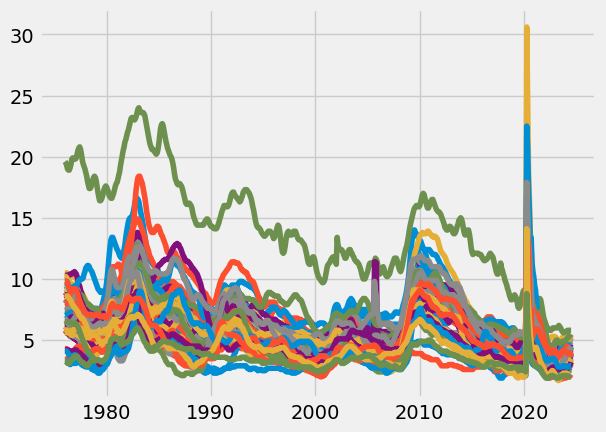

In [20]:
#we basic chart of unemployement statewise
plt.plot(unemployment_statewise)
plt.show()

In [21]:
#Plot state wise unemployment rate,also you can select the state,so it displays that states only
px.line(unemployment_statewise)

In [22]:
#Unemployement rate during corona
unemployment_corona_period=unemployment_statewise.loc[(unemployment_statewise.index > '2020-2-1') & (unemployment_statewise.index < '2020-8-1')]
unemployment_corona_period

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota
2020-03-01,5.5,5.0,4.2,4.1,4.9,4.8,3.7,3.4,3.0,4.0,...,4.4,3.9,2.7,2.6,3.7,3.1,4.8,5.0,2.4,2.4
2020-04-01,16.1,12.8,15.6,13.4,16.1,16.5,22.6,13.8,17.4,14.2,...,8.2,8.3,11.8,16.0,17.9,12.1,5.1,13.1,14.1,8.8
2020-05-01,15.8,11.6,16.7,14.2,12.9,12.8,19.2,10.4,14.9,11.6,...,6.4,11.8,9.1,11.8,15.4,9.1,8.7,13.4,9.5,6.6
2020-06-01,13.8,10.1,13.6,11.8,11.3,10.9,14.5,8.6,14.5,9.7,...,5.2,11.5,7.5,9.6,13.3,7.4,7.3,12.7,7.8,5.3
2020-07-01,13.2,9.3,12.5,11.8,10.4,9.8,12.5,7.5,12.6,8.7,...,4.6,11.7,6.6,8.3,12.2,6.7,6.8,7.5,6.7,4.7


In [23]:
#Plot state wise unemployment rate during corona
px.line(unemployment_corona_period)


In [24]:
#Unemployement rate when corona has just started
unemployment_corona=unemployment_statewise.loc[unemployment_statewise.index == '2020-3-1']
unemployment_corona

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota
2020-03-01,5.5,5.0,4.2,4.1,4.9,4.8,3.7,3.4,3.0,4.0,...,4.4,3.9,2.7,2.6,3.7,3.1,4.8,5.0,2.4,2.4


In [25]:
#Sorting unemployment rate from highest to lowest and transposing it.
ax = unemployment_corona.loc[unemployment_corona.index == '2020-03-01'].T.sort_values('2020-03-01')
ax


,2020-03-01
Hawaii,2.1
South Dakota,2.4
Vermont,2.4
North Dakota,2.4
Utah,2.5
New Hampshire,2.6
Iowa,2.6
Idaho,2.7
Massachusetts,3.0
Wisconsin,3.0


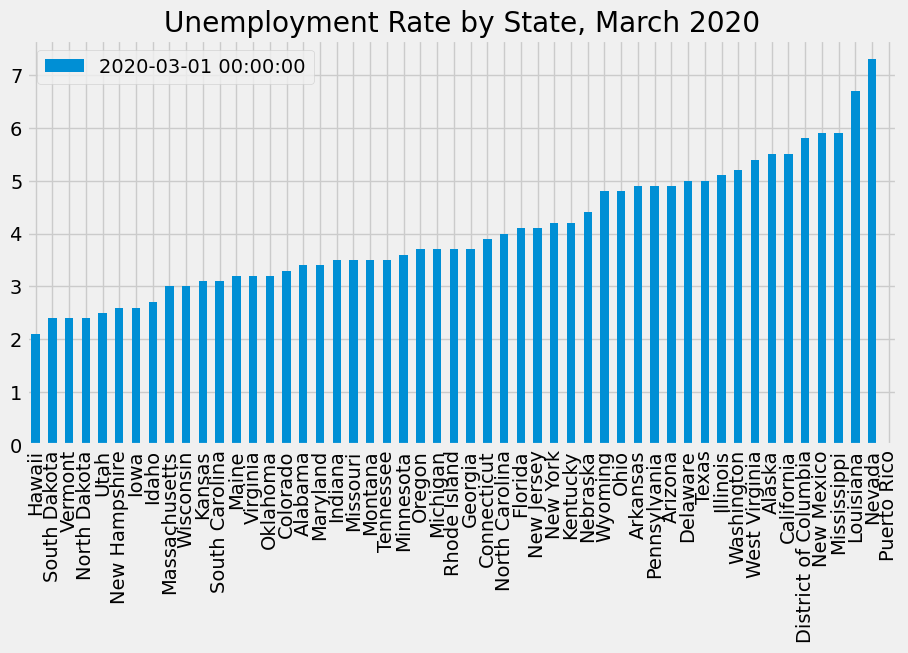

In [26]:
ax.plot(kind='bar', figsize=(10, 5), title='Unemployment Rate by State, March 2020')
plt.show()

In [27]:
#Now we are searching for job Participation rate and then Pulling that Data from FRED Website
participation_rate=fred.search('participation rate', filter=('frequency', 'Monthly'))
participation_rate=participation_rate.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')#some more Filters of Data sets
participation_rate


,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CIVPART,CIVPART,2024-09-17,2024-09-17,Labor Force Participation Rate,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:02-05:00,84,The series comes from the 'Current Population ...
LNS11300060,LNS11300060,2024-09-17,2024-09-17,Labor Force Participation Rate - 25-54 Yrs.,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:04-05:00,70,The series comes from the 'Current Population ...
LNS11300002,LNS11300002,2024-09-17,2024-09-17,Labor Force Participation Rate - Women,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:05-05:00,66,To obtain estimates of women worker employment...
LNS11300001,LNS11300001,2024-09-17,2024-09-17,Labor Force Participation Rate - Men,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:06-05:00,61,The series comes from the 'Current Population ...
LNS11324230,LNS11324230,2024-09-17,2024-09-17,Labor Force Participation Rate - 55 Yrs. & over,1948-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-06 07:47:07-05:00,54,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LRIN55MAJPM156S,LRIN55MAJPM156S,2024-09-17,2024-09-17,Infra-Annual Labor Statistics: Inactivity Rate...,1970-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-16 14:12:00-05:00,0,OECD Data Filters: REF_AREA: JPN MEASURE: OLF...
LRIN24MAJPM156S,LRIN24MAJPM156S,2024-09-17,2024-09-17,Infra-Annual Labor Statistics: Inactivity Rate...,1970-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-16 14:12:01-05:00,0,OECD Data Filters: REF_AREA: JPN MEASURE: OLF...
LRINTTTTCAM156S,LRINTTTTCAM156S,2024-09-17,2024-09-17,Infra-Annual Labor Statistics: Inactivity Rate...,1995-01-01,2024-08-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-09-16 14:13:34-05:00,0,OECD Data Filters: REF_AREA: CAN MEASURE: OLF...


In [28]:
participation_rate = participation_rate.loc[participation_rate['title'].str.contains('Labor Force Participation Rate for')]
participation_rate
# Here I have find the data of all united states ,indivudual states having thier participation rate statewise.
#Now I can pull any data from this using thier ID.


,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
LBSSA06,LBSSA06,2024-09-17,2024-09-17,Labor Force Participation Rate for California,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:04-05:00,21,A state's labor-force participation rate is th...
LBSSA01,LBSSA01,2024-09-17,2024-09-17,Labor Force Participation Rate for Alabama,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:06-05:00,13,A state's labor-force participation rate is th...
LBSSA36,LBSSA36,2024-09-17,2024-09-17,Labor Force Participation Rate for New York,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:03-05:00,23,A state's labor-force participation rate is th...
LBSSA28,LBSSA28,2024-09-17,2024-09-17,Labor Force Participation Rate for Mississippi,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:02-05:00,21,A state's labor-force participation rate is th...
LBSSA26,LBSSA26,2024-09-17,2024-09-17,Labor Force Participation Rate for Michigan,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:02-05:00,22,A state's labor-force participation rate is th...
LBSSA48,LBSSA48,2024-09-17,2024-09-17,Labor Force Participation Rate for Texas,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:03-05:00,20,A state's labor-force participation rate is th...
LBSSA12,LBSSA12,2024-09-17,2024-09-17,Labor Force Participation Rate for Florida,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:03-05:00,20,A state's labor-force participation rate is th...
LBSSA21,LBSSA21,2024-09-17,2024-09-17,Labor Force Participation Rate for Kentucky,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:02-05:00,20,A state's labor-force participation rate is th...
LBSSA39,LBSSA39,2024-09-17,2024-09-17,Labor Force Participation Rate for Ohio,1976-01-01,2024-07-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-08-16 09:01:08-05:00,14,A state's labor-force participation rate is th...


In [29]:
participation_rate.shape

(51, 15)

In [30]:
#pulling data of all states participation rate using for loop 
participation_rate=participation_rate['id'].unique()
participation_rate

array(['LBSSA06', 'LBSSA01', 'LBSSA36', 'LBSSA28', 'LBSSA26', 'LBSSA48',
       'LBSSA12', 'LBSSA21', 'LBSSA39', 'LBSSA55', 'LBSSA42', 'LBSSA25',
       'LBSSA27', 'LBSSA24', 'LBSSA54', 'LBSSA47', 'LBSSA23', 'LBSSA22',
       'LBSSA17', 'LBSSA45', 'LBSSA08', 'LBSSA37', 'LBSSA13', 'LBSSA49',
       'LBSSA18', 'LBSSA29', 'LBSSA51', 'LBSSA34', 'LBSSA19', 'LBSSA02',
       'LBSSA53', 'LBSSA04', 'LBSSA35', 'LBSSA16', 'LBSSA05', 'LBSSA40',
       'LBSSA31', 'LBSSA15', 'LBSSA32', 'LBSSA30', 'LBSSA41', 'LBSSA33',
       'LBSSA50', 'LBSSA09', 'LBSSA38', 'LBSSA46', 'LBSSA20', 'LBSSA44',
       'LBSSA11', 'LBSSA10', 'LBSSA56'], dtype=object)

In [31]:
all_state_participation=[]
for my_id in participation_rate:
    participation_rate_statewise=fred.get_series(my_id)
    participation_rate_statewise=participation_rate_statewise.to_frame(name=my_id)#converting raw data to framed data
    all_state_participation.append(participation_rate_statewise) # appending data of states
    

In [32]:
#Now we need to concatenate this data in to one data frame
#Where state are on heading of x axis and dates in y axis with Participation rate statewise
participation_rate_statewise=pd.concat(all_state_participation,axis=1)
participation_rate_statewise

,LBSSA06,LBSSA01,LBSSA36,LBSSA28,LBSSA26,LBSSA48,LBSSA12,LBSSA21,LBSSA39,LBSSA55,...,LBSSA33,LBSSA50,LBSSA09,LBSSA38,LBSSA46,LBSSA20,LBSSA44,LBSSA11,LBSSA10,LBSSA56
1976-01-01,62.6,57.0,58.0,58.8,61.6,63.8,55.8,60.5,61.7,65.6,...,65.9,63.6,64.2,62.6,64.6,65.1,63.8,64.4,62.7,65.3
1976-02-01,62.4,56.9,58.0,58.6,61.5,63.5,55.7,60.3,61.7,65.5,...,65.6,63.4,64.1,62.4,64.4,65.0,63.7,64.5,62.5,64.9
1976-03-01,62.2,56.8,58.0,58.5,61.5,63.4,55.5,60.2,61.7,65.4,...,65.6,63.2,64.0,62.3,64.4,64.9,63.6,64.5,62.5,64.7
1976-04-01,62.2,56.8,58.0,58.5,61.6,63.5,55.5,60.1,61.6,65.4,...,65.7,63.5,64.1,62.5,64.3,65.0,63.7,64.5,62.4,64.9
1976-05-01,62.3,56.8,58.1,58.5,61.7,63.6,55.4,60.1,61.6,65.5,...,66.0,63.6,64.3,62.6,64.3,65.1,63.6,64.4,62.4,65.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-01,62.0,57.4,61.4,53.7,62.3,64.1,59.4,56.9,61.8,65.6,...,65.3,65.4,64.6,68.9,67.7,66.1,64.4,72.6,60.3,63.0
2024-04-01,62.0,57.5,61.3,53.7,62.3,64.2,59.3,57.1,61.8,65.6,...,65.5,65.5,64.6,69.0,67.6,66.1,64.7,72.8,60.1,63.0
2024-05-01,62.0,57.5,61.3,53.8,62.3,64.2,59.1,57.3,61.9,65.6,...,65.6,65.6,64.7,68.9,67.5,66.1,64.9,72.7,59.9,62.9
2024-06-01,62.0,57.5,61.3,54.0,62.3,64.3,58.9,57.4,62.1,65.5,...,65.6,65.7,64.6,68.9,67.5,66.1,65.1,72.6,59.8,63.0


In [33]:


# Create a dictionary to map series IDs to state names
state_code_mapping = {
    'LBSSA06': 'California',
    'LBSSA01': 'Alabama',
    'LBSSA36': 'New York',
    'LBSSA28': 'Mississippi',
    'LBSSA26': 'Michigan',
    'LBSSA48': 'Texas',
    'LBSSA12': 'Florida',
    'LBSSA21': 'Kentucky',
    'LBSSA39': 'Ohio',
    'LBSSA55': 'Wisconsin',
    'LBSSA42': 'Pennsylvania',
    'LBSSA25': 'Massachusetts',
    'LBSSA27': 'Minnesota',
    'LBSSA24': 'Maryland',
    'LBSSA54': 'West Virginia',
    'LBSSA47': 'Tennessee',
    'LBSSA23': 'Maine',
    'LBSSA22': 'Louisiana',
    'LBSSA17': 'Illinois',
    'LBSSA45': 'South Carolina',
    'LBSSA08': 'Colorado',
    'LBSSA37': 'North Carolina',
    'LBSSA13': 'Georgia',
    'LBSSA49': 'Utah',
    'LBSSA18': 'Indiana',
    'LBSSA29': 'Missouri',
    'LBSSA51': 'Virginia',
    'LBSSA34': 'New Jersey',
    'LBSSA19': 'Iowa',
    'LBSSA02': 'Alaska',
    'LBSSA53': 'Washington',
    'LBSSA04': 'Arizona',
    'LBSSA35': 'New Mexico',
    'LBSSA16': 'Idaho',
    'LBSSA05': 'Arkansas',
    'LBSSA40': 'Oklahoma',
    'LBSSA31': 'Nebraska',
    'LBSSA15': 'Hawaii',
    'LBSSA32': 'Nevada',
    'LBSSA30': 'Montana',
    'LBSSA41': 'Oregon',
    'LBSSA33': 'North Dakota',
    'LBSSA50': 'Vermont',
    'LBSSA09': 'Connecticut',
    'LBSSA38': 'North Dakota',
    'LBSSA46': 'South Dakota',
    'LBSSA20': 'Kansas',
    'LBSSA44': 'Rhode Island',
    'LBSSA11': 'District of Columbia',
    'LBSSA10': 'Delaware',
    'LBSSA56': 'Wyoming'
}

participation_rate_statewise.rename(columns=state_code_mapping, inplace=True)

participation_rate_statewise



,California,Alabama,New York,Mississippi,Michigan,Texas,Florida,Kentucky,Ohio,Wisconsin,...,North Dakota,Vermont,Connecticut,North Dakota,South Dakota,Kansas,Rhode Island,District of Columbia,Delaware,Wyoming
1976-01-01,62.6,57.0,58.0,58.8,61.6,63.8,55.8,60.5,61.7,65.6,...,65.9,63.6,64.2,62.6,64.6,65.1,63.8,64.4,62.7,65.3
1976-02-01,62.4,56.9,58.0,58.6,61.5,63.5,55.7,60.3,61.7,65.5,...,65.6,63.4,64.1,62.4,64.4,65.0,63.7,64.5,62.5,64.9
1976-03-01,62.2,56.8,58.0,58.5,61.5,63.4,55.5,60.2,61.7,65.4,...,65.6,63.2,64.0,62.3,64.4,64.9,63.6,64.5,62.5,64.7
1976-04-01,62.2,56.8,58.0,58.5,61.6,63.5,55.5,60.1,61.6,65.4,...,65.7,63.5,64.1,62.5,64.3,65.0,63.7,64.5,62.4,64.9
1976-05-01,62.3,56.8,58.1,58.5,61.7,63.6,55.4,60.1,61.6,65.5,...,66.0,63.6,64.3,62.6,64.3,65.1,63.6,64.4,62.4,65.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-01,62.0,57.4,61.4,53.7,62.3,64.1,59.4,56.9,61.8,65.6,...,65.3,65.4,64.6,68.9,67.7,66.1,64.4,72.6,60.3,63.0
2024-04-01,62.0,57.5,61.3,53.7,62.3,64.2,59.3,57.1,61.8,65.6,...,65.5,65.5,64.6,69.0,67.6,66.1,64.7,72.8,60.1,63.0
2024-05-01,62.0,57.5,61.3,53.8,62.3,64.2,59.1,57.3,61.9,65.6,...,65.6,65.6,64.7,68.9,67.5,66.1,64.9,72.7,59.9,62.9
2024-06-01,62.0,57.5,61.3,54.0,62.3,64.3,58.9,57.4,62.1,65.5,...,65.6,65.7,64.6,68.9,67.5,66.1,65.1,72.6,59.8,63.0


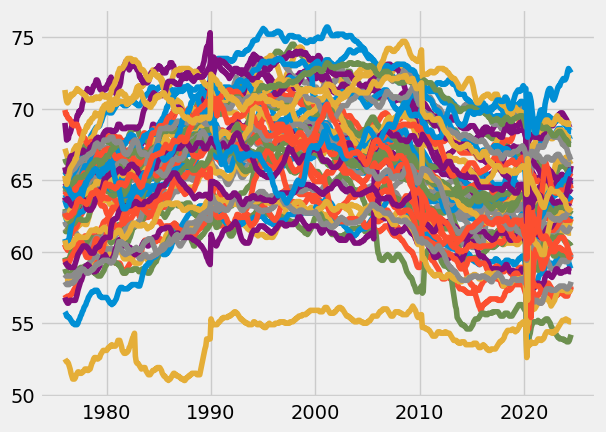

In [34]:
#we basic chart of participation rate statewise
plt.plot(participation_rate_statewise)
plt.show()

In [35]:
# Reshape the DataFrame and plot the line chart in one step
px.line(
    participation_rate_statewise.reset_index().melt(id_vars='index', var_name='State', value_name='ParticipationRate'),
    x='index',
    y='ParticipationRate',
    color='State',
    )



This line reshapes the DataFrame `participation_rate_statewise` from a **wide** format (where each state's participation rates are in separate columns) to a **long** format (where there are three columns: Date, State, and Participation Rate). This operation is essential for plotting or analyzing data when you want all your values to be in one column instead of spread across many.
participation_rate_statewise.reset_index().melt(id_vars='index', var_name='State', value_name='ParticipationRate')


### 1. `participation_rate_statewise.reset_index()`

This converts the index (which is the date, as we have seen from your earlier output) into a regular column.

- **Before**: The dates are part of the index.
- **After**: The dates are moved into a new column, typically called `index` by default.

For example, assuming `participation_rate_statewise` looks like this:

| Date       | California | Alabama | ... |
|------------|------------|---------|-----|
| 1976-01-01 | 5.6        | 4.3     | ... |
| 1976-02-01 | 5.7        | 4.2     | ... |

After `reset_index()`, it will look like this:

| index      | California | Alabama | ... |
|------------|------------|---------|-----|
| 1976-01-01 | 5.6        | 4.3     | ... |
| 1976-02-01 | 5.7        | 4.2     | ... |

### 2. `.melt(id_vars='index', var_name='State', value_name='ParticipationRate')`

The `melt()` function reshapes the DataFrame from wide to long format. Here’s how it works:

- **`id_vars='index'`**: This specifies which column to leave as-is, meaning the `index` column (which holds the date values) will stay the same and won't be "melted."
  
- **`var_name='State'`**: This is the name for the new column that will hold the original column headers (state names). All state names (currently columns like 'California', 'Alabama', etc.) will be gathered into one single column called `State`.
  
- **`value_name='ParticipationRate'`**: This is the name for the new column that will contain the participation rate values (previously in the individual columns for each state). All values from each state's original column will be placed into this single `ParticipationRate` column.

#### Result

The new "long" DataFrame looks like this:

| index      | State      | ParticipationRate |
|------------|------------|-------------------|
| 1976-01-01 | California | 5.6               |
| 1976-01-01 | Alabama    | 4.3               |
| 1976-02-01 | California | 5.7               |
| 1976-02-01 | Alabama    | 4.2               |
| ...        | ...        | ...               |

In summary:
- **`index`** (date) stays the same in every row.
- **`State`** (original column names, like 'California', 'Alabama') becomes a new column.
- **`ParticipationRate`** (the values under each state) becomes the corresponding participation rate for each state on each date.

### Why is this necessary?

This "long" format makes it easier to plot or work with the data, especially in libraries like Plotly, because instead of needing to specify each state's data separately, you have all the information in a single column (`State`), which can be easily grouped and used as a categorical axis or for color-coding.
'''

In [36]:
#Plotting unemployement VS participation

#Unemployement rate from Jan 2020 to Dec 2021
unemployment_corona_period_newyork=unemployment_statewise['New York'].loc[(unemployment_statewise.index >= '2020-1-1') & (unemployment_statewise.index < '2022-1-1')]
unemployment_corona_period_newyork

2020-01-01     4.1
2020-02-01     4.1
2020-03-01     4.2
2020-04-01    15.6
2020-05-01    16.7
2020-06-01    13.6
2020-07-01    12.5
2020-08-01    10.8
2020-09-01    10.2
2020-10-01     9.2
2020-11-01     9.0
2020-12-01     8.7
2021-01-01     8.6
2021-02-01     8.4
2021-03-01     8.1
2021-04-01     7.9
2021-05-01     7.5
2021-06-01     7.5
2021-07-01     7.0
2021-08-01     6.8
2021-09-01     6.3
2021-10-01     5.9
2021-11-01     5.6
2021-12-01     5.5
Freq: MS, Name: New York, dtype: float64

In [37]:
#Plot state wise unemployment rate during corona
px.line(unemployment_corona_period_newyork)


In [38]:
#Plotting unemployement VS participation
#Participation rate from Jan 2020 to Dec 2021
participation_rate_statewise_newyork=participation_rate_statewise['New York'].loc[(participation_rate_statewise.index >= '2020-1-1') & (participation_rate_statewise.index < '2022-1-1')]
participation_rate_statewise_newyork

2020-01-01    61.0
2020-02-01    60.9
2020-03-01    60.7
2020-04-01    56.1
2020-05-01    58.0
2020-06-01    58.7
2020-07-01    58.9
2020-08-01    58.6
2020-09-01    58.9
2020-10-01    58.7
2020-11-01    58.9
2020-12-01    59.0
2021-01-01    59.0
2021-02-01    59.1
2021-03-01    59.2
2021-04-01    59.3
2021-05-01    59.4
2021-06-01    59.6
2021-07-01    59.6
2021-08-01    59.6
2021-09-01    59.5
2021-10-01    59.6
2021-11-01    59.6
2021-12-01    59.9
Name: New York, dtype: float64

In [39]:
#Plot state wise unemployment rate during corona
px.line(participation_rate_statewise_newyork)


<Axes: >

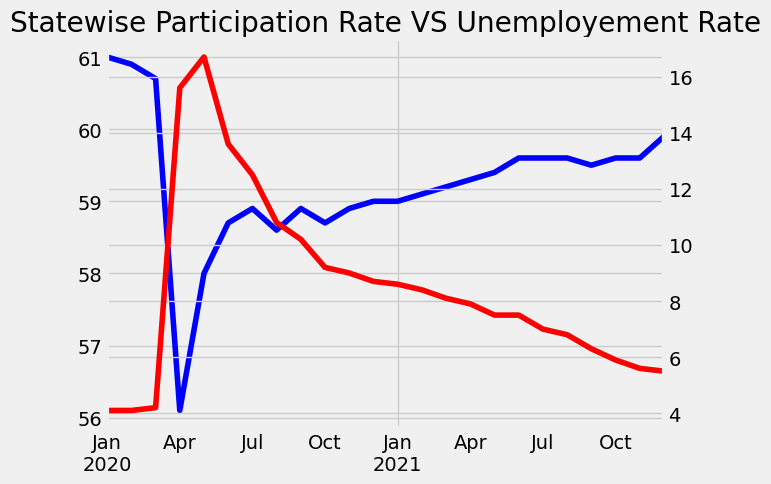

In [40]:
# Create subplots for New york states
fig, ax1 = plt.subplots()
# Assuming participation_rate_statewise is a DataFrame where index represents states and the column represents the participation rate
participation_rate_statewise_newyork.plot(kind='line',ax=ax1,color='b')
plt.title('Statewise Participation Rate VS Unemployement Rate')


ax2 = ax1.twinx()
unemployment_corona_period_newyork.plot(kind='line',ax=ax2,color='r')






In [41]:
#Plotting unemployement VS participation
#Participation rate from Jan 2020 to Dec 2021
participation_rate_statewise=participation_rate_statewise.loc[(participation_rate_statewise.index >= '2020-1-1') & (participation_rate_statewise.index < '2022-1-1')]
participation_rate_statewise
unemployment_corona_period=unemployment_statewise.loc[(unemployment_statewise.index >= '2020-1-1') & (unemployment_statewise.index < '2022-1-1')]
unemployment_corona_period



,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota
2020-01-01,4.3,3.5,4.1,3.0,4.5,4.4,3.7,3.2,3.0,3.8,...,3.0,3.8,2.8,2.6,3.6,3.1,4.4,3.6,2.0,2.6
2020-02-01,4.4,3.6,4.1,3.0,4.7,4.6,3.7,3.3,3.0,3.8,...,3.0,3.8,2.8,2.6,3.7,3.1,4.6,3.6,2.1,2.5
2020-03-01,5.5,5.0,4.2,4.1,4.9,4.8,3.7,3.4,3.0,4.0,...,4.4,3.9,2.7,2.6,3.7,3.1,4.8,5.0,2.4,2.4
2020-04-01,16.1,12.8,15.6,13.4,16.1,16.5,22.6,13.8,17.4,14.2,...,8.2,8.3,11.8,16.0,17.9,12.1,5.1,13.1,14.1,8.8
2020-05-01,15.8,11.6,16.7,14.2,12.9,12.8,19.2,10.4,14.9,11.6,...,6.4,11.8,9.1,11.8,15.4,9.1,8.7,13.4,9.5,6.6
2020-06-01,13.8,10.1,13.6,11.8,11.3,10.9,14.5,8.6,14.5,9.7,...,5.2,11.5,7.5,9.6,13.3,7.4,7.3,12.7,7.8,5.3
2020-07-01,13.2,9.3,12.5,11.8,10.4,9.8,12.5,7.5,12.6,8.7,...,4.6,11.7,6.6,8.3,12.2,6.7,6.8,7.5,6.7,4.7
2020-08-01,11.9,8.1,10.8,8.8,9.3,8.3,10.0,6.3,10.4,7.3,...,3.9,9.6,5.4,6.7,10.3,5.8,6.2,7.3,5.5,4.0
2020-09-01,10.0,7.7,10.2,8.1,8.8,7.6,8.9,5.9,9.7,6.7,...,3.5,8.8,5.0,6.1,9.9,5.4,5.9,7.5,4.9,3.7
2020-10-01,9.3,7.1,9.2,7.1,8.1,6.8,7.7,5.2,8.5,6.0,...,3.1,7.9,4.4,5.2,7.0,4.9,5.6,5.1,4.4,3.3


In [42]:
#Dropping district of columbia,Puerto Rico from both the table
participation_rate_statewise.columns


Index(['California', 'Alabama', 'New York', 'Mississippi', 'Michigan', 'Texas',
       'Florida', 'Kentucky', 'Ohio', 'Wisconsin', 'Pennsylvania',
       'Massachusetts', 'Minnesota', 'Maryland', 'West Virginia', 'Tennessee',
       'Maine', 'Louisiana', 'Illinois', 'South Carolina', 'Colorado',
       'North Carolina', 'Georgia', 'Utah', 'Indiana', 'Missouri', 'Virginia',
       'New Jersey', 'Iowa', 'Alaska', 'Washington', 'Arizona', 'New Mexico',
       'Idaho', 'Arkansas', 'Oklahoma', 'Nebraska', 'Hawaii', 'Nevada',
       'Montana', 'Oregon', 'North Dakota', 'Vermont', 'Connecticut',
       'North Dakota', 'South Dakota', 'Kansas', 'Rhode Island',
       'District of Columbia', 'Delaware', 'Wyoming'],
      dtype='object')

In [43]:
unemployment_corona_period.columns


Index(['California', 'Texas', 'New York', 'Florida', 'Pennsylvania', 'Ohio',
       'Michigan', 'Alabama', 'Massachusetts', 'North Carolina', 'Illinois',
       'New Jersey', 'Georgia', 'Colorado', 'Arizona', 'Wisconsin', 'Virginia',
       'Kentucky', 'South Carolina', 'New Mexico', 'Minnesota', 'Tennessee',
       'Washington', 'Maryland', 'Oregon', 'West Virginia', 'Nevada',
       'Arkansas', 'Oklahoma', 'Missouri', 'Alaska', 'Iowa', 'Utah',
       'Puerto Rico', 'Indiana', 'Louisiana', 'Hawaii', 'North Dakota',
       'Montana', 'District of Columbia', 'Mississippi', 'Maine', 'Nebraska',
       'Connecticut', 'Idaho', 'New Hampshire', 'Rhode Island', 'Kansas',
       'Wyoming', 'Delaware', 'Vermont', 'South Dakota'],
      dtype='object')

In [44]:
# Find the common columns between both DataFrames as some columns name are ambiguous and some states are not usa states in data so removing it.
common_columns = participation_rate_statewise.columns.intersection(unemployment_corona_period.columns)

# Subset both DataFrames to keep only the common columns
participation_rate_statewise = participation_rate_statewise[common_columns]
unemployment_corona_period = unemployment_corona_period[common_columns]

# Print the updated column lists to verify
print("Common columns between both DataFrames:")
print(participation_rate_statewise.columns)
print(unemployment_corona_period.columns)


Common columns between both DataFrames:
Index(['California', 'Alabama', 'New York', 'Mississippi', 'Michigan', 'Texas',
       'Florida', 'Kentucky', 'Ohio', 'Wisconsin', 'Pennsylvania',
       'Massachusetts', 'Minnesota', 'Maryland', 'West Virginia', 'Tennessee',
       'Maine', 'Louisiana', 'Illinois', 'South Carolina', 'Colorado',
       'North Carolina', 'Georgia', 'Utah', 'Indiana', 'Missouri', 'Virginia',
       'New Jersey', 'Iowa', 'Alaska', 'Washington', 'Arizona', 'New Mexico',
       'Idaho', 'Arkansas', 'Oklahoma', 'Nebraska', 'Hawaii', 'Nevada',
       'Montana', 'Oregon', 'North Dakota', 'North Dakota', 'Vermont',
       'Connecticut', 'South Dakota', 'Kansas', 'Rhode Island',
       'District of Columbia', 'Delaware', 'Wyoming'],
      dtype='object')
Index(['California', 'Alabama', 'New York', 'Mississippi', 'Michigan', 'Texas',
       'Florida', 'Kentucky', 'Ohio', 'Wisconsin', 'Pennsylvania',
       'Massachusetts', 'Minnesota', 'Maryland', 'West Virginia', 'Tennesse

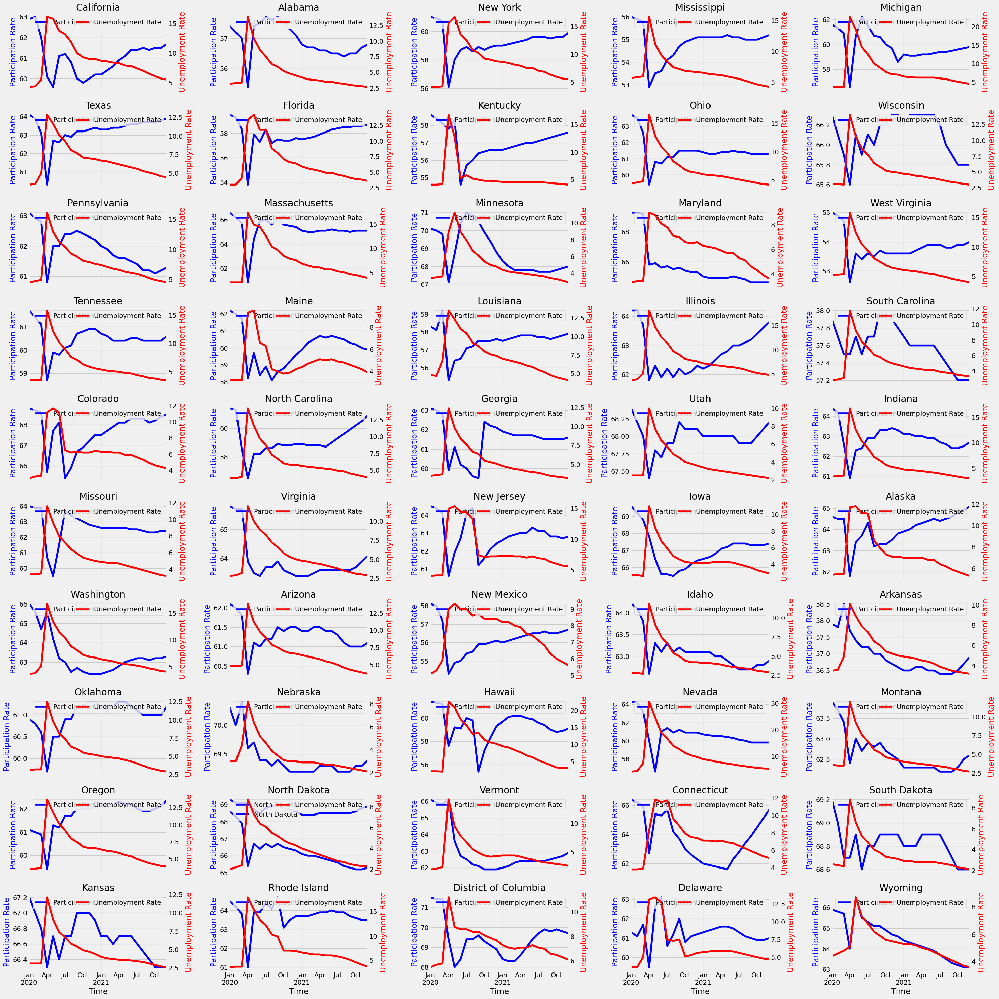

In [45]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(10, 5, figsize=(30, 30), sharex=True)
axs = axs.flatten()

for i, state in enumerate(unemployment_corona_period.columns):
    # Create a twin axis
    ax2 = axs[i].twinx()
    
    # Plot participation rate on the primary axis
    participation_rate_statewise[state].plot(kind='line', ax=axs[i], color='b', label='Participation Rate')
    
    # Plot unemployment rate on the secondary axis
    unemployment_corona_period[state].plot(kind='line', ax=ax2, color='r', label='Unemployment Rate')
    
    # Set titles and labels
    axs[i].set_title(state)
    axs[i].set_xlabel('Time')
    axs[i].set_ylabel('Participation Rate', color='b')
    ax2.set_ylabel('Unemployment Rate', color='r')
    
    # Optionally add a legend
    axs[i].legend(loc='upper left')
    ax2.legend(loc='upper right')
    
    # Remove grid for the secondary axis
    ax2.grid(False)

plt.tight_layout()
plt.show()


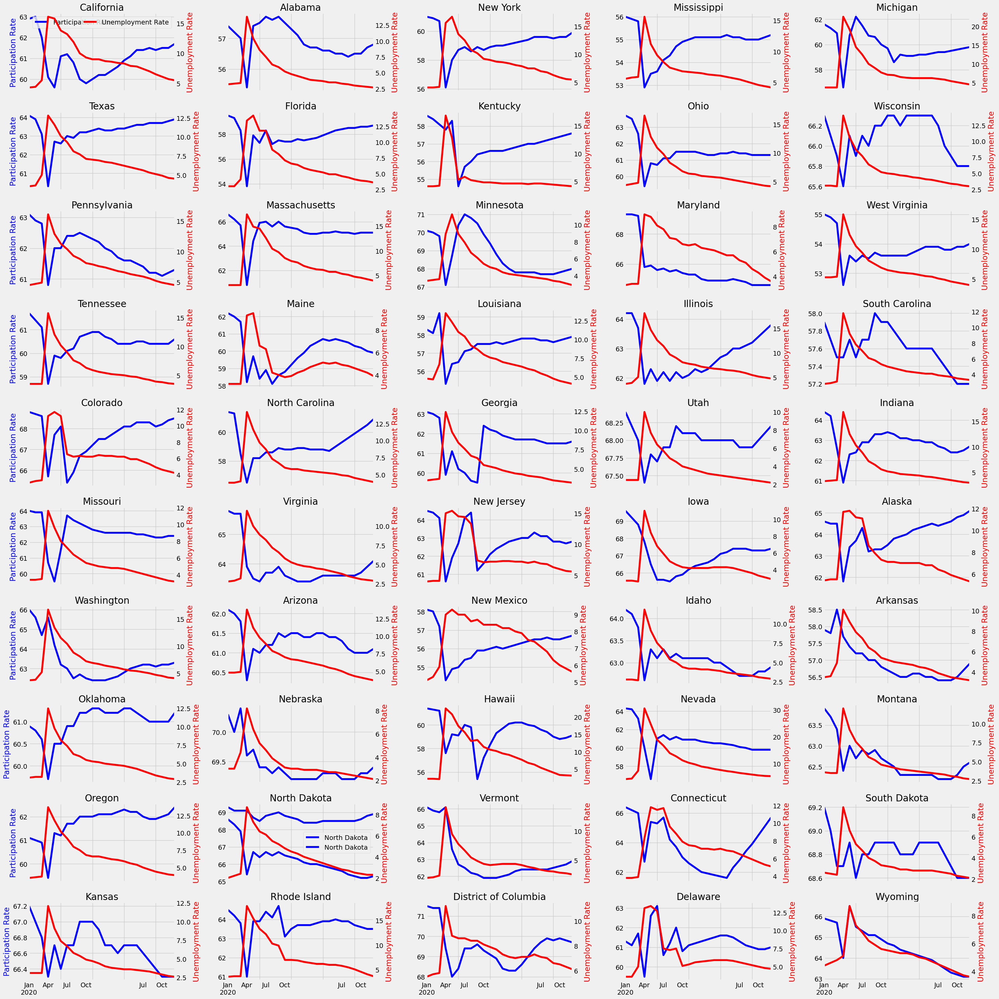

In [46]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(10, 5, figsize=(30, 30), sharex=True)
axs = axs.flatten()

for i, state in enumerate(unemployment_corona_period.columns):
    # Create a twin axis
    ax2 = axs[i].twinx()
    
    # Plot participation rate on the primary axis
    participation_rate_statewise[state].plot(kind='line', ax=axs[i], color='b', label='Participation Rate')
    
    # Plot unemployment rate on the secondary axis
    unemployment_corona_period[state].plot(kind='line', ax=ax2, color='r', label='Unemployment Rate')
    
    # Set titles and labels
    axs[i].set_title(state)
    
    # Set y-labels only for the leftmost subplots
    if i % 5 == 0:
        axs[i].set_ylabel('Participation Rate', color='b')
    else:
        axs[i].set_ylabel('')
    
    ax2.set_ylabel('Unemployment Rate', color='r')
    
    # Remove redundant x-labels (shared axes)
    if i < 45:
        axs[i].set_xlabel('')
    
    # Reduce the number of ticks
    axs[i].xaxis.set_major_locator(plt.MaxNLocator(5))
    
    # Optionally add a legend only for the first plot
    if i == 0:
        axs[i].legend(loc='upper left')
        ax2.legend(loc='upper right')
    
    # Remove grid for the secondary axis
    ax2.grid(False)

# Adjust x-ticks to be more readable
plt.xticks(rotation=45)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()
